# Advanced Approach for Trace Clustering - Exploration

## Imports

In [1]:
%reload_ext autoreload
%autoreload 2
import warnings
warnings.filterwarnings('ignore')
from IPython.utils import io

import pandas as pd
import pm4py
from pm4py.algo.discovery.heuristics import algorithm as heuristics_miner
from pm4py.objects.conversion.log import converter as log_converter
import numpy as np
from karateclub.node_embedding.neighbourhood import Node2Vec, Walklets
from karateclub.node_embedding import GraphWave
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from umap import UMAP
from minisom import MiniSom
from clustpy.deep import DEC, IDEC
from practical.ProcessMining.group1.shared import utils
from practical.ProcessMining.group1.shared.visualizer import Visualizer
from practical.ProcessMining.group1.task4.tokenreplay import TokenReplay

visualizer = Visualizer()
LOG_PATH = "../shared/example_files/DomesticDeclarations.xes"   
experiment_results = {}

## Helper Functions

### Data Preparation

In [2]:
def get_traces_from_log(log):
    ids = list(log["case:concept:name"].unique())
    traces = [["".join(x) for x in list(log[log["case:concept:name"] == case_id]["concept:name"])] for case_id in ids]
    return ids, traces

def create_graph(log):
    graph = nx.Graph()
    dfg = pm4py.discover_dfg(log)
    for edge in dfg[0].items():
        graph.add_weighted_edges_from([(edge[0][0], edge[0][1], edge[1])])
    for node in dfg[1].items():
        if node not in graph.nodes():
            graph.add_node(node[0], start=True)
    for node in dfg[2].items():
        if node not in graph.nodes():
            graph.add_node(node[0], end=True)
    return graph

def apply_mapping(graph, traces):
    mapping = dict(zip(graph.nodes(), [i for i in range(len(graph.nodes()))]))
    graph = nx.relabel_nodes(graph, mapping)
    mapped_traces = [[mapping[a] for a in trace] for trace in traces]
    return graph, mapped_traces

### Graph Embeddings

In [3]:
def generate_node2vec_node_embeddings(graph, mapped_traces):
    model = Node2Vec()
    model.fit(graph)
    embeddings = model.get_embedding()
    vectors = []
    for trace in mapped_traces:
        trace_vector = []
        for token in trace:
            trace_vector.append(embeddings[token])
        if len(trace_vector) == 0:
            trace_vector.append(np.zeros(128))
        vectors.append(np.array(trace_vector).mean(axis=0))
    return vectors

def generate_node2vec_edge_embeddings(graph, mapped_traces):
    model = Node2Vec()
    model.fit(graph)
    embeddings = model.get_embedding()
    vectors = []
    for trace in mapped_traces:
        trace_vector = []
        for i in range(len(trace)-1):
            emb1, emb2 = embeddings[trace[i]], embeddings[trace[i+1]]
            trace_vector.append((emb1 + emb2)/2.0)
        if len(trace_vector) == 0:
            trace_vector.append(np.zeros(128))
        vectors.append(np.array(trace_vector).mean(axis=0))
    return vectors

def generate_graphwave_embeddings(graph, mapped_traces):
    model = GraphWave()
    model.fit(graph)
    embeddings = model.get_embedding()
    vectors = []
    for trace in mapped_traces:
        trace_vector = []
        for token in trace:
            trace_vector.append(embeddings[token])
        vectors.append(np.array(trace_vector).mean(axis=0))
    return vectors

def generate_walklets_node_embeddings(graph, mapped_traces):
    model = Walklets()
    model.fit(graph)
    embeddings = model.get_embedding()
    vectors = []
    for trace in mapped_traces:
        trace_vector = []
        for token in trace:
            trace_vector.append(embeddings[token])
        if len(trace_vector) == 0:
            trace_vector.append(np.zeros(32))
        vectors.append(np.array(trace_vector).mean(axis=0))
    return vectors

def generate_walklets_edge_embeddings(graph, mapped_traces):
    model = Walklets()
    model.fit(graph)
    embeddings = model.get_embedding()
    vectors = []
    for trace in mapped_traces:
        trace_vector = []
        for i in range(len(trace)-1):
            emb1, emb2 = embeddings[trace[i]], embeddings[trace[i+1]]
            trace_vector.append((emb1 + emb2)/2.0)
        if len(trace_vector) == 0:
            trace_vector.append(np.zeros(128))
        vectors.append(np.array(trace_vector).mean(axis=0))
    return vectors

def get_encoding_df(vectors, ids):
    encoded_df = pd.DataFrame(vectors, columns=[f'{i}' for i in range(len(vectors[0]))])
    encoded_df.insert(0, "case", ids)
    return encoded_df

### Clustering

In [4]:
def cluster_data_kmeans(encoded_df, n_clusters=5, **kwargs):
    X = encoded_df.iloc[:, 1:]
    clusters = KMeans(n_clusters=n_clusters, random_state=42, **kwargs).fit_predict(X)
    return clusters

def cluster_data_gmm(encoded_df, n_clusters=5, **kwargs):
    X = encoded_df.iloc[:, 1:]
    clusters  = GaussianMixture(n_components=n_clusters, random_state=42, **kwargs).fit_predict(X)
    return clusters

def cluster_data_som(encoded_df, n_clusters=5, **kwargs):
    X = encoded_df.iloc[:, 1:]
    som = MiniSom(1, n_clusters, X.shape[1], sigma=0.6, learning_rate=0.5, **kwargs)
    som.train_batch(X.values, 3000)
    clusters = [som.winner(x)[1] for x in X.values]
    return clusters

def cluster_data_hierarchical(encoded_df, n_clusters=5, **kwargs):
    X = encoded_df.iloc[:, 1:]
    clusters = AgglomerativeClustering(n_clusters=n_clusters, **kwargs).fit_predict(X)
    return clusters

def cluster_data_dec(encoded_df, n_clusters=5, **kwargs):
    X = encoded_df.iloc[:, 1:].to_numpy()
    dec = DEC(n_clusters=n_clusters, embedding_size=X.shape[1], **kwargs)
    clusters  = dec.fit_predict(X)
    return clusters

def cluster_data_idec(encoded_df, n_clusters=5, **kwargs):
    X = encoded_df.iloc[:, 1:].to_numpy()
    idec = IDEC(n_clusters=n_clusters, embedding_size=X.shape[1], **kwargs)
    clusters = idec.fit_predict(X)
    return clusters

def add_clusters_to_log(log, encoding, clusters):
    log_with_clusters = log.copy()
    encoding_with_clusters = encoding.copy()
    encoding_with_clusters["cluster"] = clusters
    log_with_clusters["cluster"] = log_with_clusters["case:concept:name"].map(encoding_with_clusters.set_index("case")["cluster"])
    return log_with_clusters

def split_log_by_clusters(log_with_clusters):
    clustered_logs = {}
    for cluster in log_with_clusters["cluster"].unique():
        clustered_logs[cluster] = log_with_clusters[log_with_clusters["cluster"] == cluster]
    return clustered_logs

### Process Mining and Evaluation

In [5]:
def evaluate_model(log, net, im, fm):
    with io.capture_output() as captured:
        fitness = pm4py.conformance.fitness_alignments(log, net, im, fm)
        precision = pm4py.conformance.precision_alignments(log, net, im, fm)
        generalization = pm4py.algo.evaluation.generalization.algorithm.apply(log, net, im, fm)
        simplicity = pm4py.algo.evaluation.simplicity.algorithm.apply(net)
    
    return { "fitness": fitness['averageFitness'], 
             "precision": precision, 
             "generalization": generalization, 
             "simplicity": simplicity,
             "log_length": log.shape[0]}

def mine_petri_nets(clustered_logs, encoding, clusters, name=""):
    scores = {}
    for cluster, cluster_log in sorted(clustered_logs.items()):
        print(f'=== Cluster {cluster}: {cluster_log.shape[0]} events, {cluster_log["case:concept:name"].unique().shape[0]} cases ===')
        net, im, fm, graph = viz_petri_net(cluster_log)
        visualizer.display(graph)
        scores[cluster] = evaluate_model(cluster_log, net, im, fm)
        scores[cluster]["custom"] = utils.custom_metric(cluster_log, encoding, clusters, net, im, fm)
    
    scores_df = pd.DataFrame(scores).T
    scores_df.index.name = 'Cluster'
    print(f'=== Process Model Scores ===')
    print(scores_df)
    
    log_lengths = scores_df["log_length"]
    weighted_average_scores = scores_df.drop(columns="log_length").multiply(log_lengths, axis=0).sum() / log_lengths.sum()
    experiment_results[name] = weighted_average_scores
    print(f'=== Weighted Average Process Model Scores ===')
    print(weighted_average_scores)
    
    print(f'=== Clustering Scores ===')
    score = silhouette_score(encoding, clusters)
    print(f'Silhouette Score: {score}')
    custom_metric = scores_df["custom"].mean()
    print(f'Custom Metric: {custom_metric}')
    
def viz_petri_net(log):
    net, im, fm = heuristics_miner.apply(log)
    log = log_converter.to_event_log.apply(log)
    with io.capture_output() as captured:
        replay = TokenReplay(log, net, im, fm, "HM")
        replay.run(log)
    tokens = replay.get_unconformity_tokens()
    graph = visualizer.build_petri_net(net, im, fm, tokens)
    return net, im, fm, graph


def plot_dimension_reduction(X, clusters):
    plt.figure(figsize=(10, 5))

    title_fontsize = 16
    legend_fontsize = 14
    
    # PCA
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(X)
    ax1 = plt.subplot(1, 2, 1)
    for cluster in np.unique(clusters):
        ix = np.where(clusters == cluster)
        ax1.scatter(pca_result[ix, 0], pca_result[ix, 1], label=cluster, s=10)
    ax1.set_title('PCA - Clustering Results', fontsize=title_fontsize)
    
    # UMAP
    umap = UMAP(n_components=2)
    umap_result = umap.fit_transform(X)
    ax2 = plt.subplot(1, 2, 2)
    for cluster in np.unique(clusters):
        ix = np.where(clusters == cluster)
        ax2.scatter(umap_result[ix, 0], umap_result[ix, 1], label=cluster, s=10)
    ax2.set_title('UMAP - Clustering Results', fontsize=title_fontsize)
    
    handles, labels = ax1.get_legend_handles_labels()
    plt.figlegend(handles, labels, loc='lower center', ncol=5, labelspacing=0., fontsize=legend_fontsize, bbox_to_anchor=(0.5, -0.1))
    
    plt.show()

## Data Exploration and Preprocessing

Before we start with the advanced approach, we need to load the event logs and perform some basic data exploration and preprocessing steps. 
We will load the event logs, print some basic statistics, and visualize the event log in its initial spaghetti model form.

_"After submission by the employee, the request is sent for approval to the travel administration. If approved, the request is then forwarded to the budget owner and after that to the supervisor. If the budget owner and supervisor are the same person, then only one of these steps is taken. In some cases, the director also needs to approve the request.The process finished with either the trip taking place or a payment being requested and payed. "_

[BPI Challenge 2020: Domestic Declarations](https://data.4tu.nl/datasets/6a0a26d2-82d0-4018-b1cd-89afb0e8627f)

In [6]:
print(f'Loading {LOG_PATH} ...')
log = utils.import_xes(LOG_PATH)
log

Loading ../shared/example_files/DomesticDeclarations.xes ...


parsing log, completed traces ::   0%|          | 0/10500 [00:00<?, ?it/s]

,id,org:resource,concept:name,time:timestamp,org:role,case:id,case:concept:name,case:BudgetNumber,case:DeclarationNumber,case:Amount
0,st_step 86794_0,STAFF MEMBER,Declaration SUBMITTED by EMPLOYEE,2017-01-09 09:49:50+00:00,EMPLOYEE,declaration 86791,declaration 86791,budget 86566,declaration number 86792,26.851205
1,st_step 86793_0,STAFF MEMBER,Declaration FINAL_APPROVED by SUPERVISOR,2017-01-09 11:27:48+00:00,SUPERVISOR,declaration 86791,declaration 86791,budget 86566,declaration number 86792,26.851205
2,dd_declaration 86791_19,SYSTEM,Request Payment,2017-01-10 09:34:44+00:00,UNDEFINED,declaration 86791,declaration 86791,budget 86566,declaration number 86792,26.851205
3,dd_declaration 86791_20,SYSTEM,Payment Handled,2017-01-12 17:31:22+00:00,UNDEFINED,declaration 86791,declaration 86791,budget 86566,declaration number 86792,26.851205
4,st_step 86798_0,STAFF MEMBER,Declaration SUBMITTED by EMPLOYEE,2017-01-09 10:26:14+00:00,EMPLOYEE,declaration 86795,declaration 86795,budget 86566,declaration number 86796,182.464172
...,...,...,...,...,...,...,...,...,...,...
56432,st_step 138363_0,STAFF MEMBER,Declaration SUBMITTED by EMPLOYEE,2018-12-29 17:50:14+00:00,EMPLOYEE,declaration 138359,declaration 138359,budget 86566,declaration number 138360,190.404576
56433,st_step 138361_0,STAFF MEMBER,Declaration APPROVED by ADMINISTRATION,2018-12-29 17:56:13+00:00,ADMINISTRATION,declaration 138359,declaration 138359,budget 86566,declaration number 138360,190.404576
56434,st_step 138362_0,STAFF MEMBER,Declaration FINAL_APPROVED by SUPERVISOR,2019-01-03 08:55:52+00:00,SUPERVISOR,declaration 138359,declaration 138359,budget 86566,declaration number 138360,190.404576
56435,dd_declaration 138359_19,SYSTEM,Request Payment,2019-01-08 08:20:28+00:00,UNDEFINED,declaration 138359,declaration 138359,budget 86566,declaration number 138360,190.404576


In [7]:
# most frequent activities
log["concept:name"].value_counts()

Declaration SUBMITTED by EMPLOYEE             11531
Declaration FINAL_APPROVED by SUPERVISOR      10131
Payment Handled                               10044
Request Payment                               10040
Declaration APPROVED by ADMINISTRATION         8202
Declaration APPROVED by BUDGET OWNER           2820
Declaration REJECTED by EMPLOYEE               1365
Declaration REJECTED by ADMINISTRATION          952
Declaration APPROVED by PRE_APPROVER            685
Declaration REJECTED by SUPERVISOR              293
Declaration SAVED by EMPLOYEE                   135
Declaration REJECTED by MISSING                  91
Declaration REJECTED by PRE_APPROVER             86
Declaration REJECTED by BUDGET OWNER             59
Declaration FOR_APPROVAL by SUPERVISOR            1
Declaration FOR_APPROVAL by PRE_APPROVER          1
Declaration FOR_APPROVAL by ADMINISTRATION        1
Name: concept:name, dtype: int64

In [8]:
trace_per_case = log.groupby("case:concept:name")["concept:name"].aggregate(lambda x: tuple(x))
# unique traces
print(f'Unique traces: {trace_per_case.unique().shape[0]}')
# most frequent traces
for trace, freq in trace_per_case.value_counts().head().items():
    print(f'{trace} ({freq} occurrences)')
# least frequent traces
for trace, freq in trace_per_case.value_counts().tail().items():
    print(f'{trace} ({freq} occurrences)')

Unique traces: 99
('Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by ADMINISTRATION', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled') (4618 occurrences)
('Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by ADMINISTRATION', 'Declaration APPROVED by BUDGET OWNER', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled') (2473 occurrences)
('Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled') (1392 occurrences)
('Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by PRE_APPROVER', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled') (575 occurrences)
('Declaration SUBMITTED by EMPLOYEE', 'Declaration REJECTED by ADMINISTRATION', 'Declaration REJECTED by EMPLOYEE', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by ADMINISTRATION', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Paym

Average trace length: 5.374952380952381


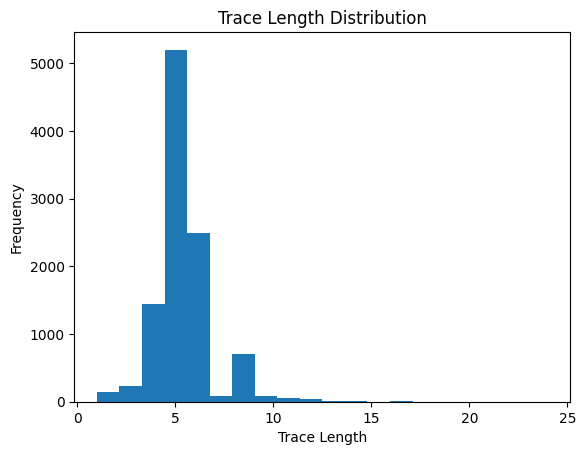

In [9]:
# average trace length
trace_lengths = [len(trace) for trace in trace_per_case]
print(f'Average trace length: {np.mean(trace_lengths)}')
# trace length distribution
plt.hist(trace_lengths, bins=20)
plt.xlabel('Trace Length')
plt.ylabel('Frequency')
plt.title('Trace Length Distribution')
plt.show()

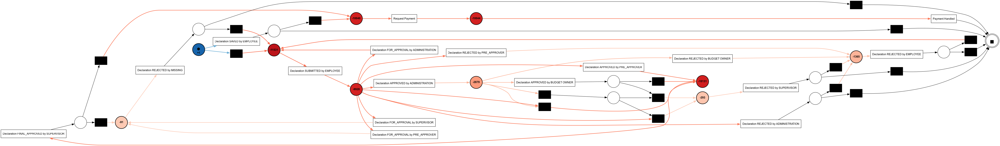

In [10]:
net, im, fm , graph = viz_petri_net(log)
visualizer.display(graph)

## Graph Encodings

Node2Vec, GraphWave, and Walklets are used to encode the graph structure of the event log. Afterward L2 normalization is applied to the embeddings. 

In [11]:
ids, traces = get_traces_from_log(log)

for id, trace in zip(ids, traces):
    print(f'{id}: {trace}')

declaration 86791: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled']
declaration 86795: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by PRE_APPROVER', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled']
declaration 86800: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by PRE_APPROVER', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled']
declaration 86731: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled']
declaration 86735: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled']
declaration 86805: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled']
declaration 86809: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED b

In [12]:
graph = create_graph(log)
graph, mapped_traces = apply_mapping(graph, traces)

for id, trace in zip(ids, mapped_traces):
    print(f'{id}: {trace}')

declaration 86791: [10, 2, 8, 7]
declaration 86795: [10, 5, 2, 8, 7]
declaration 86800: [10, 5, 2, 8, 7]
declaration 86731: [10, 2, 8, 7]
declaration 86735: [10, 2, 8, 7]
declaration 86805: [10, 2, 8, 7]
declaration 86809: [10, 2, 6, 10, 2, 8, 7]
declaration 86816: [10, 2, 8, 7]
declaration 86716: [10, 2, 8, 7]
declaration 86720: [10, 2, 6, 10, 15, 14, 10, 5, 2, 8, 7]
declaration 86820: [10, 2, 8, 7]
declaration 86824: [10, 2, 8, 7]
declaration 86828: [10, 2, 8, 7]
declaration 86739: [10, 2, 6, 10, 2, 8, 7]
declaration 86746: [10, 2, 8, 7]
declaration 86750: [16]
declaration 86752: [10, 2, 8, 7]
declaration 86756: [10, 2, 8, 7]
declaration 86832: [10, 2, 8, 7]
declaration 86836: [10, 2, 8, 7]
declaration 86760: [10, 2, 8, 7]
declaration 86764: [10, 2, 6, 10, 2, 8, 7]
declaration 86771: [10, 5, 2, 8, 7]
declaration 86840: [10, 2, 6, 10, 2, 8, 7]
declaration 86776: [10, 2, 6, 10, 2, 8, 7]
declaration 86783: [10, 2, 8, 7]
declaration 86847: [10, 2, 8, 7]
declaration 86851: [10, 2, 8, 7]
d

In [13]:
node2vec_node_embeddings = get_encoding_df(generate_node2vec_node_embeddings(graph, mapped_traces), ids)
node2vec_edge_embeddings = get_encoding_df(generate_node2vec_edge_embeddings(graph, mapped_traces), ids)

graphWave_node_embeddings = get_encoding_df(generate_graphwave_embeddings(graph, mapped_traces), ids)

walklets_node_embeddings = get_encoding_df(generate_walklets_node_embeddings(graph, mapped_traces), ids)
walklets_edge_embeddings = get_encoding_df(generate_walklets_edge_embeddings(graph, mapped_traces), ids)

2024-07-10 19:49:11,492:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!


## Clustering with KMeans

### Node2Vec Node Embeddings

=== Cluster 0: 25013 events, 4865 cases ===


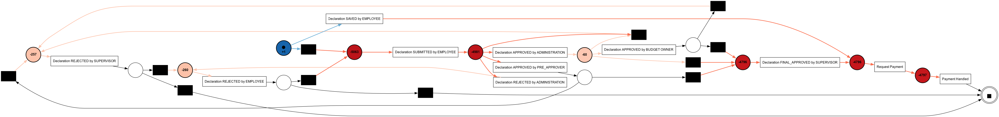

=== Cluster 1: 22943 events, 3660 cases ===


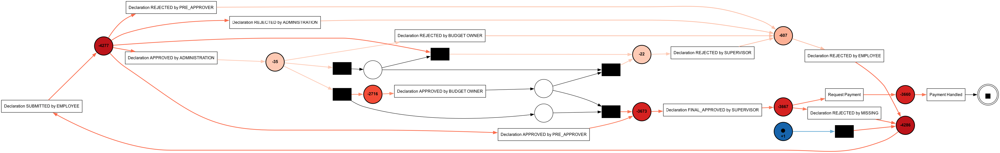

=== Cluster 2: 5950 events, 1459 cases ===


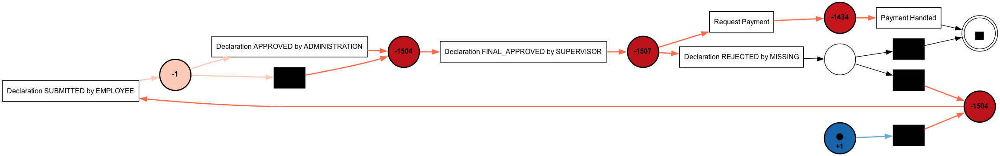

=== Cluster 3: 2397 events, 382 cases ===


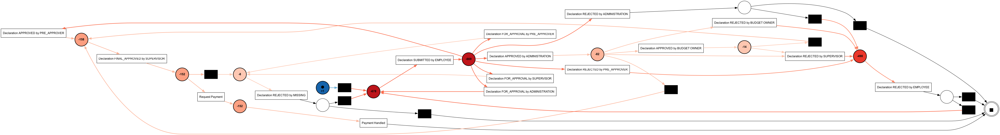

=== Cluster 4: 134 events, 134 cases ===


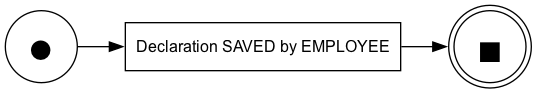

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.994581   0.998912        0.745456    0.666667     25013.0  0.889379
1        0.990804   0.925998        0.781759    0.647059     22943.0  0.862914
2        0.999706   0.891144        0.837507    0.818182      5950.0  0.852941
3        0.987792   0.775801        0.731533    0.606061      2397.0  0.809592
4        1.000000   1.000000        0.913613    1.000000       134.0  0.891114
=== Weighted Average Process Model Scores ===
fitness           0.993310
precision         0.948436
generalization    0.769727
simplicity        0.672887
custom            0.871394
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.7277848124504089
Custom Metric: 0.8611880026507096


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


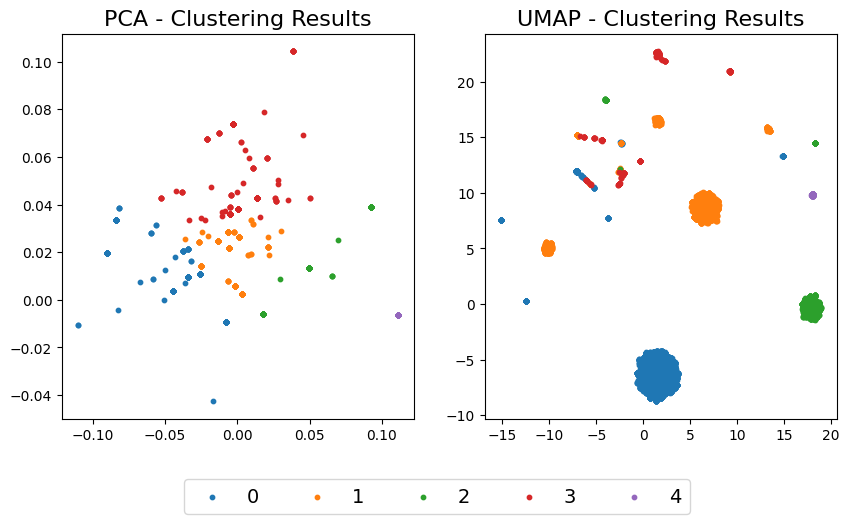

In [14]:
clusters_kmeans_node2vec_node = cluster_data_kmeans(node2vec_node_embeddings, n_clusters=5)
clustered_data_kmeans_node2vec_node = add_clusters_to_log(log, node2vec_node_embeddings, clusters_kmeans_node2vec_node)
clustered_logs_kmeans_node2vec_node = split_log_by_clusters(clustered_data_kmeans_node2vec_node)

mine_petri_nets(clustered_logs=clustered_logs_kmeans_node2vec_node, 
                encoding=node2vec_node_embeddings.iloc[:, 1:], 
                clusters=clusters_kmeans_node2vec_node,
                name="Node2Vec Node Embeddings + KMeans")
plot_dimension_reduction(node2vec_node_embeddings.iloc[:, 1:], clusters_kmeans_node2vec_node)

### Node2Vec Edge Embeddings

=== Cluster 0: 23121 events, 4625 cases ===


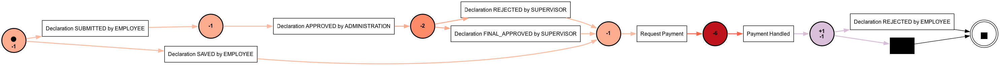

=== Cluster 1: 134 events, 134 cases ===


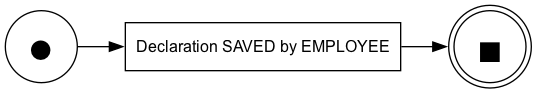

=== Cluster 2: 5942 events, 1458 cases ===


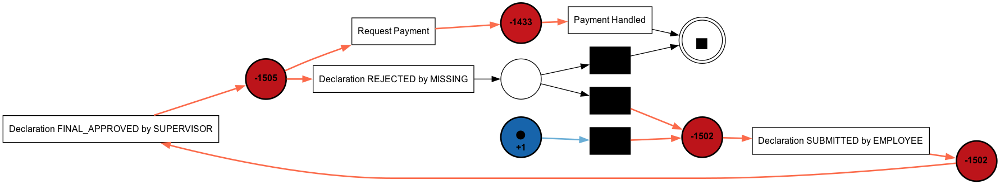

=== Cluster 3: 17935 events, 3074 cases ===


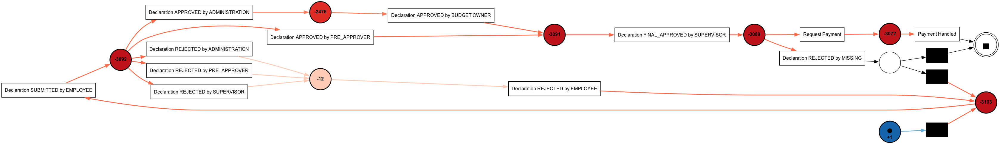

=== Cluster 4: 9305 events, 1209 cases ===


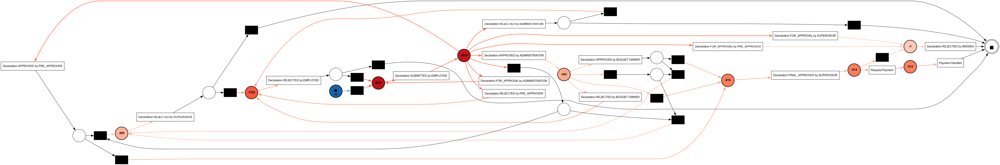

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.999763   0.999986        0.689406    0.800000     23121.0  0.924747
1        1.000000   1.000000        0.913613    1.000000       134.0  0.924812
2        0.999706   0.999832        0.924782    0.882353      5942.0  0.924679
3        0.999543   0.883304        0.754717    0.714286     17935.0  0.883854
4        0.941291   0.790467        0.696259    0.595238      9305.0  0.836798
=== Weighted Average Process Model Scores ===
fitness           0.990047
precision         0.928345
generalization    0.736605
simplicity        0.748147
custom            0.897244
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.8120289056647244
Custom Metric: 0.8989778955078599


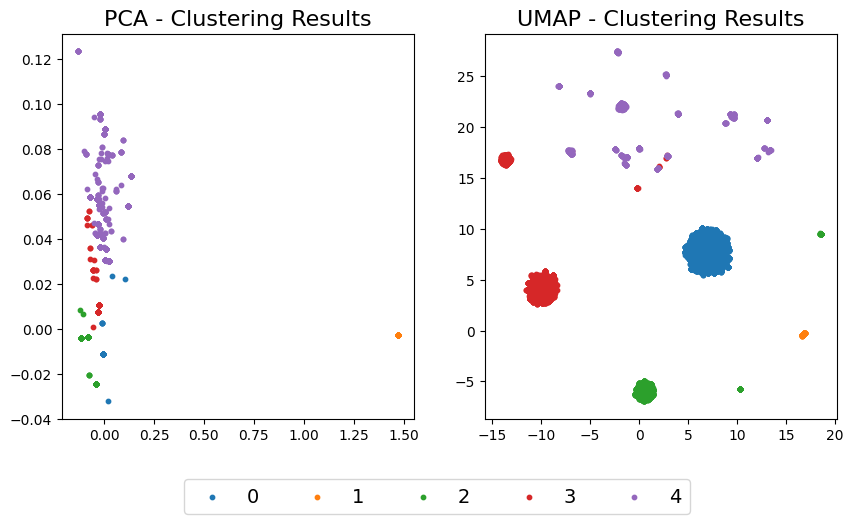

In [15]:
clusters_kmeans_node2vec_edge = cluster_data_kmeans(node2vec_edge_embeddings, n_clusters=5)
clustered_data_kmeans_node2vec_edge = add_clusters_to_log(log, node2vec_edge_embeddings, clusters_kmeans_node2vec_edge)
clustered_logs_kmeans_node2vec_edge = split_log_by_clusters(clustered_data_kmeans_node2vec_edge)

mine_petri_nets(clustered_logs=clustered_logs_kmeans_node2vec_edge, 
                encoding=node2vec_edge_embeddings.iloc[:, 1:], 
                clusters=clusters_kmeans_node2vec_edge,
                name="Node2Vec Edge Embeddings + KMeans")
plot_dimension_reduction(node2vec_edge_embeddings.iloc[:, 1:], clusters_kmeans_node2vec_edge)

### GraphWave Embeddings

=== Cluster 0: 28658 events, 6010 cases ===


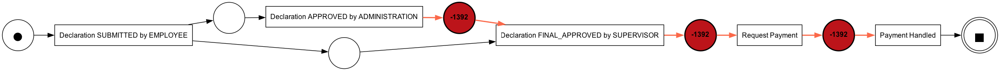

=== Cluster 1: 1233 events, 309 cases ===


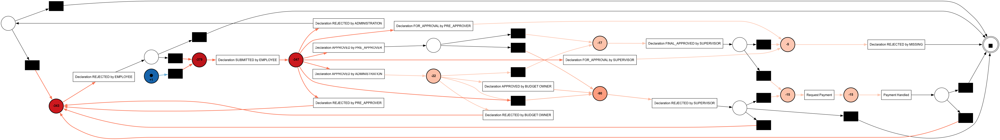

=== Cluster 2: 11253 events, 1526 cases ===


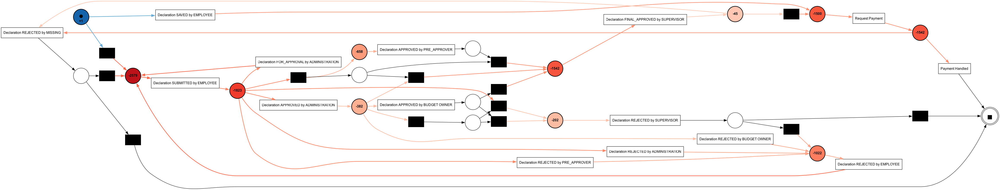

=== Cluster 3: 15159 events, 2521 cases ===


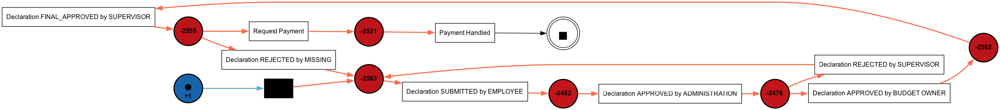

=== Cluster 4: 134 events, 134 cases ===


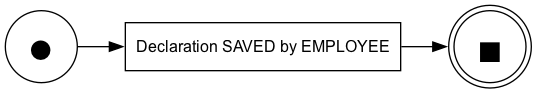

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.974265   1.000000        0.986738    1.000000     28658.0  0.921479
1        0.959806   0.921726        0.610692    0.615385      1233.0  0.890468
2        0.931560   0.898105        0.765542    0.589744     11253.0  0.875139
3        0.994582   0.923883        0.856041    0.894737     15159.0  0.899917
4        1.000000   1.000000        0.913613    1.000000       134.0  0.927913
=== Weighted Average Process Model Scores ===
fitness           0.970953
precision         0.957528
generalization    0.899139
simplicity        0.881522
custom            0.905786
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.8197817588518408
Custom Metric: 0.9029833921529826


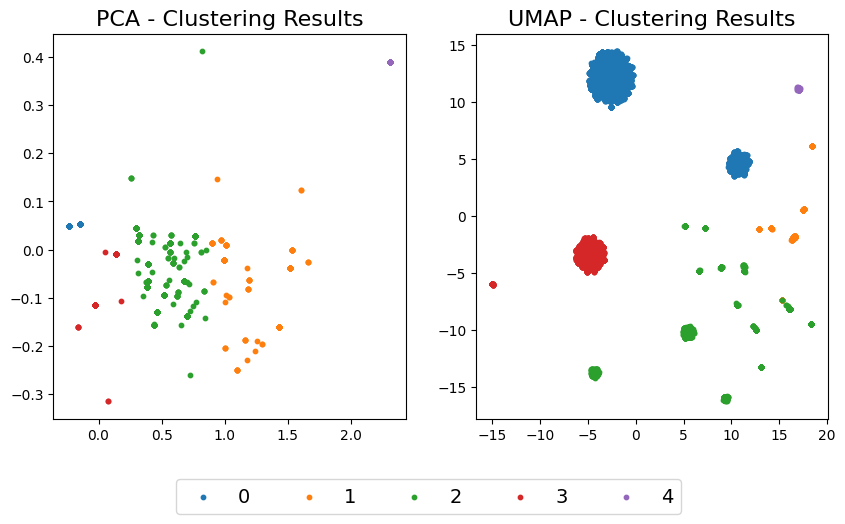

In [16]:
clusters_kmeans_graphWave = cluster_data_kmeans(graphWave_node_embeddings, n_clusters=5)
clustered_data_kmeans_graphWave = add_clusters_to_log(log, graphWave_node_embeddings, clusters_kmeans_graphWave)
clustered_logs_kmeans_graphWave = split_log_by_clusters(clustered_data_kmeans_graphWave)

mine_petri_nets(clustered_logs=clustered_logs_kmeans_graphWave, 
                encoding=graphWave_node_embeddings.iloc[:, 1:], 
                clusters=clusters_kmeans_graphWave,
                name="GraphWave Node Embeddings + KMeans")
plot_dimension_reduction(graphWave_node_embeddings.iloc[:, 1:], clusters_kmeans_graphWave)

### Walklets Node Embeddings

=== Cluster 0: 23098 events, 4619 cases ===


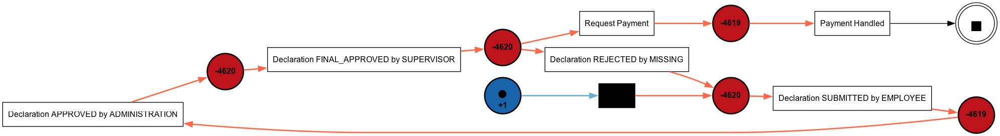

=== Cluster 1: 8661 events, 1162 cases ===


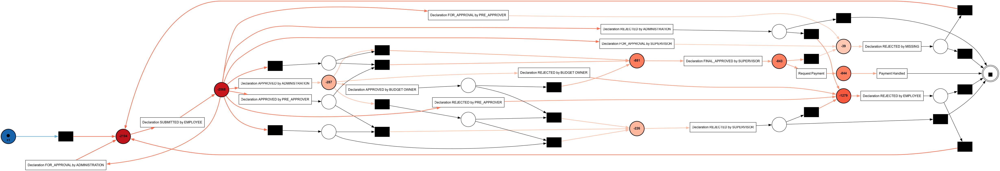

=== Cluster 2: 8803 events, 2018 cases ===


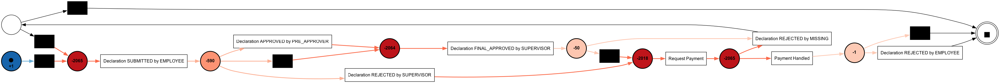

=== Cluster 3: 15738 events, 2566 cases ===


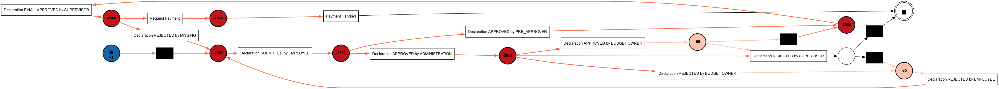

=== Cluster 4: 137 events, 135 cases ===


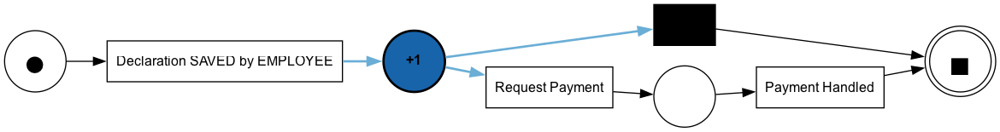

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.999983   0.900019        0.844531    1.000000     23098.0  0.898492
1        0.874902   0.793691        0.706677    0.578947      8661.0  0.830007
2        0.993155   1.000000        0.779483    0.705882      8803.0  0.931778
3        0.995502   0.929720        0.750898    0.722222     15738.0  0.907767
4        1.000000   1.000000        0.456887    1.000000       137.0  0.933489
=== Weighted Average Process Model Scores ===
fitness           0.978473
precision         0.907822
generalization    0.786178
simplicity        0.812047
custom            0.895845
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.8337236046791077
Custom Metric: 0.9003067379529279


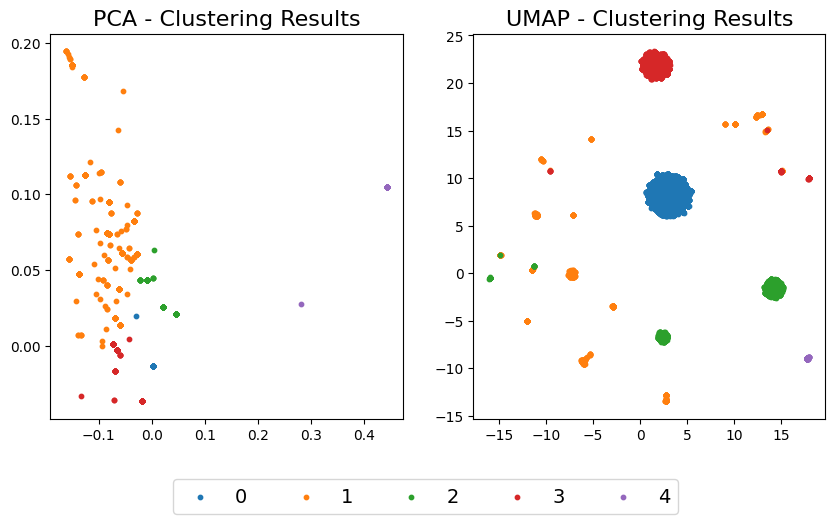

In [17]:
clusters_kmeans_walklets_node = cluster_data_kmeans(walklets_node_embeddings, n_clusters=5)
clustered_data_kmeans_walklets_node = add_clusters_to_log(log, walklets_node_embeddings, clusters_kmeans_walklets_node)
clustered_logs_kmeans_walklets_node = split_log_by_clusters(clustered_data_kmeans_walklets_node)

mine_petri_nets(clustered_logs=clustered_logs_kmeans_walklets_node, 
                encoding=walklets_node_embeddings.iloc[:, 1:], 
                clusters=clusters_kmeans_walklets_node,
                name="Walklets Node Embeddings + KMeans")
plot_dimension_reduction(walklets_node_embeddings.iloc[:, 1:], clusters_kmeans_walklets_node)

=== Cluster 0: 23098 events, 4619 cases ===


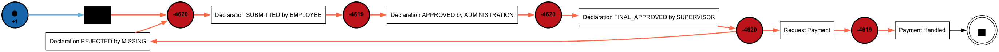

=== Cluster 1: 134 events, 134 cases ===


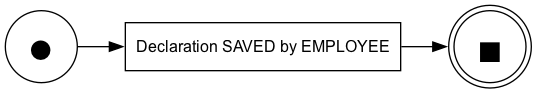

=== Cluster 2: 8806 events, 2019 cases ===


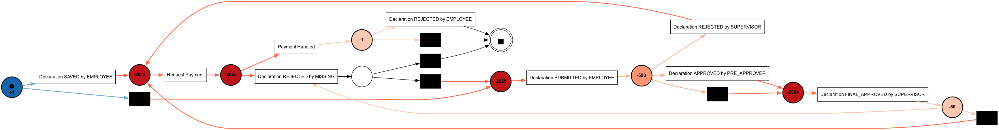

=== Cluster 3: 8633 events, 1156 cases ===


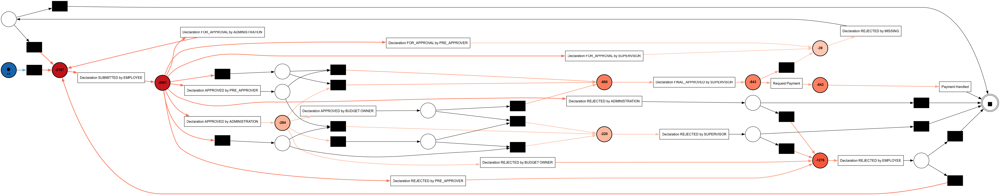

=== Cluster 4: 15766 events, 2572 cases ===


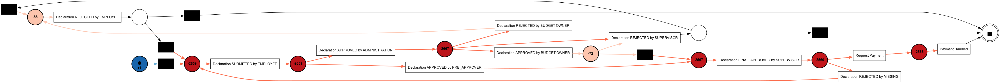

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.999983   0.900019        0.844531    1.000000     23098.0  0.898151
1        1.000000   1.000000        0.913613    1.000000       134.0  0.933149
2        0.992476   1.000000        0.727518    0.675676      8806.0  0.931268
3        0.876883   0.793373        0.694508    0.578947      8633.0  0.830050
4        0.994266   0.929827        0.765310    0.707317     15766.0  0.907155
=== Weighted Average Process Model Scores ===
fitness           0.978385
precision         0.907871
generalization    0.781358
simplicity        0.803225
custom            0.895500
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.8328719432384626
Custom Metric: 0.8999546035687626


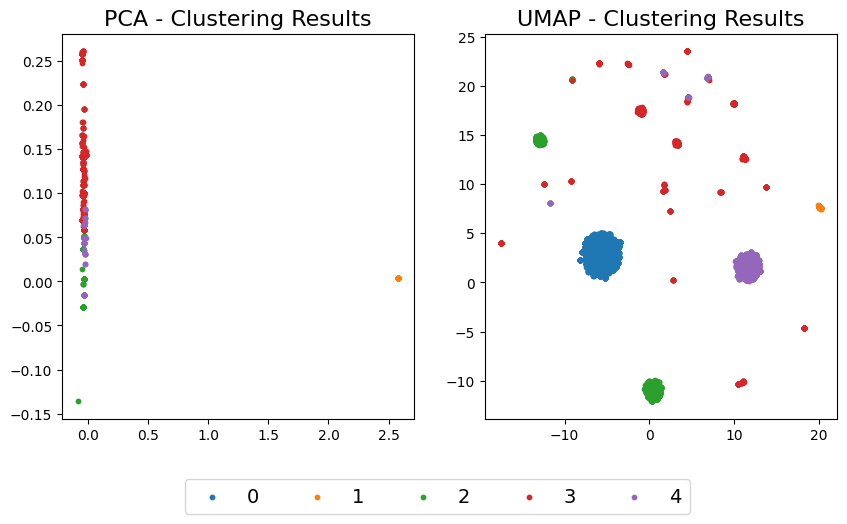

In [18]:
clusters_kmeans_walklets_edge = cluster_data_kmeans(walklets_edge_embeddings, n_clusters=5)
clustered_data_kmeans_walklets_edge = add_clusters_to_log(log, walklets_node_embeddings, clusters_kmeans_walklets_edge)
clustered_logs_kmeans_walklets_edge = split_log_by_clusters(clustered_data_kmeans_walklets_edge)

mine_petri_nets(clustered_logs=clustered_logs_kmeans_walklets_edge, 
                encoding=walklets_edge_embeddings.iloc[:, 1:], 
                clusters=clusters_kmeans_walklets_edge,
                name="Walklets Edge Embeddings + KMeans")
plot_dimension_reduction(walklets_edge_embeddings.iloc[:, 1:], clusters_kmeans_walklets_edge)

## Clustering with Agglomerative Clustering

### Node2Vec Node Embeddings

=== Cluster 0: 40832 events, 7673 cases ===


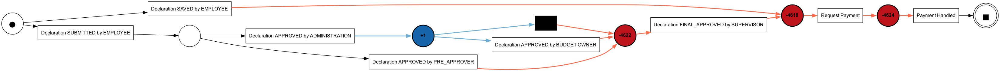

=== Cluster 1: 5942 events, 1458 cases ===


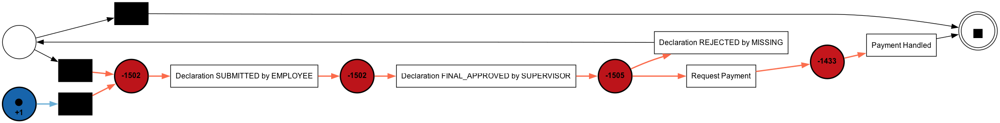

=== Cluster 2: 7255 events, 958 cases ===


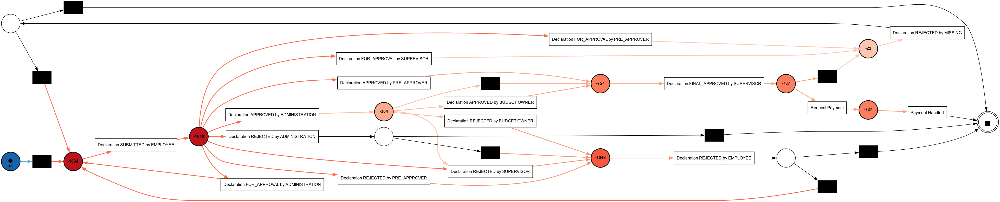

=== Cluster 3: 134 events, 134 cases ===


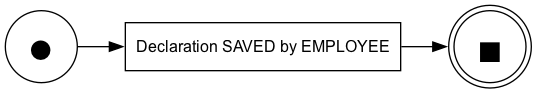

=== Cluster 4: 2274 events, 277 cases ===


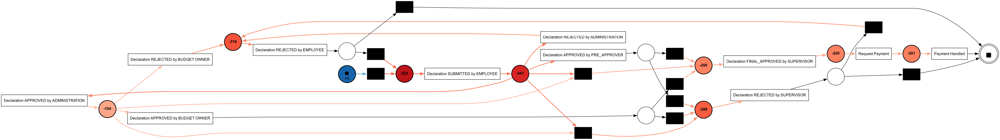

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.999893   1.000000        0.873994    0.800000     40832.0  0.863574
1        0.999706   0.999832        0.924782    0.882353      5942.0  0.863468
2        0.996570   0.773813        0.766918    0.593750      7255.0  0.783578
3        1.000000   1.000000        0.913613    1.000000       134.0  0.863601
4        0.873192   0.915078        0.781750    0.642857      2274.0  0.802176
=== Weighted Average Process Model Scores ===
fitness           0.994341
precision         0.967484
generalization    0.861954
simplicity        0.776300
custom            0.850805
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.6590014696121216
Custom Metric: 0.8352792474319533


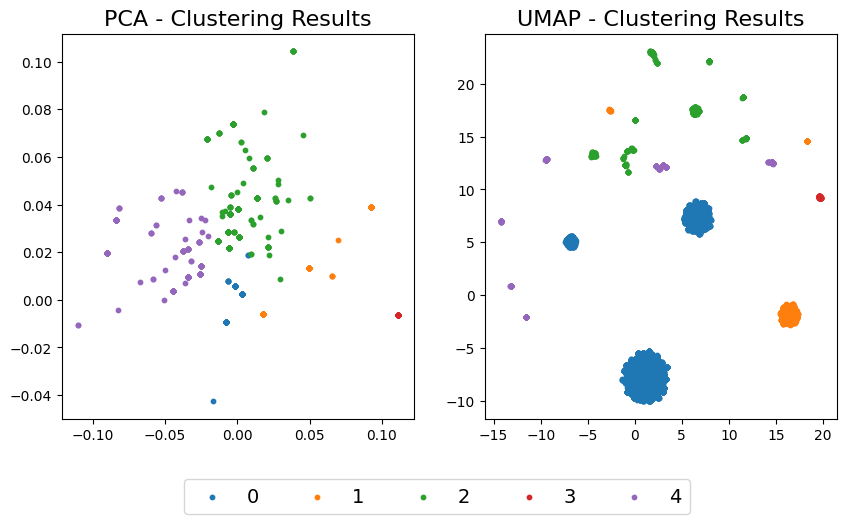

In [19]:
clusters_hierarchical_node2vec_node = cluster_data_hierarchical(node2vec_node_embeddings, n_clusters=5)
clustered_data_hierarchical_node2vec_node = add_clusters_to_log(log, node2vec_node_embeddings, clusters_hierarchical_node2vec_node)
clustered_logs_hierarchical_node2vec_node = split_log_by_clusters(clustered_data_hierarchical_node2vec_node)

mine_petri_nets(clustered_logs=clustered_logs_hierarchical_node2vec_node,
                encoding=node2vec_node_embeddings.iloc[:, 1:], 
                clusters=clusters_hierarchical_node2vec_node,
                name="Node2Vec Node Embeddings + Agglomerative Clustering")
plot_dimension_reduction(node2vec_node_embeddings.iloc[:, 1:], clusters_hierarchical_node2vec_node)

### Node2Vec Edge Embeddings

=== Cluster 0: 8813 events, 1144 cases ===


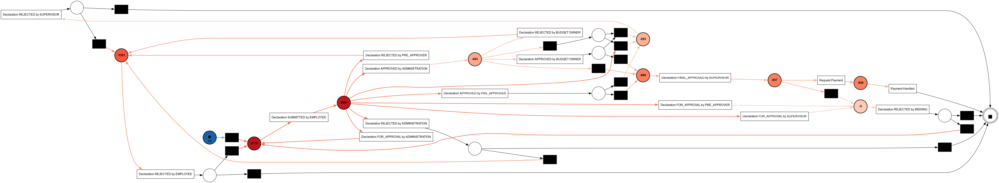

=== Cluster 1: 23109 events, 4623 cases ===


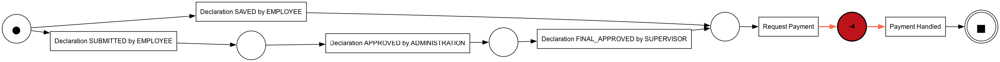

=== Cluster 2: 18813 events, 3207 cases ===


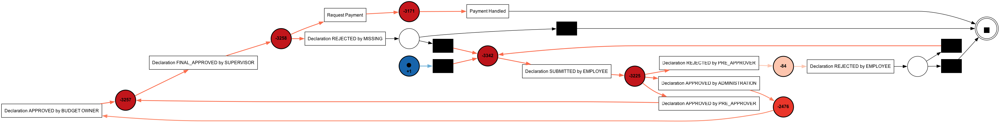

=== Cluster 3: 134 events, 134 cases ===


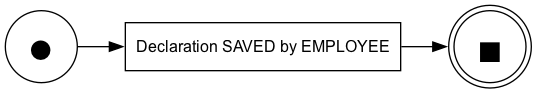

=== Cluster 4: 5568 events, 1392 cases ===


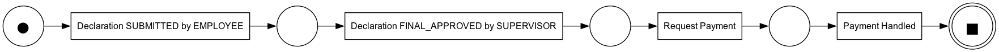

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.947447   0.789922        0.680931    0.600000      8813.0  0.833629
1        0.999876   1.000000        0.821075    1.000000     23109.0  0.920264
2        0.995692   0.941238        0.914561    0.764706     18813.0  0.898651
3        1.000000   1.000000        0.913613    1.000000       134.0  0.920295
4        1.000000   1.000000        0.973197    1.000000      5568.0  0.920295
=== Weighted Average Process Model Scores ===
fitness           0.990307
precision         0.947607
generalization    0.845582
simplicity        0.859103
custom            0.899534
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.8007370084850064
Custom Metric: 0.8986267543596698


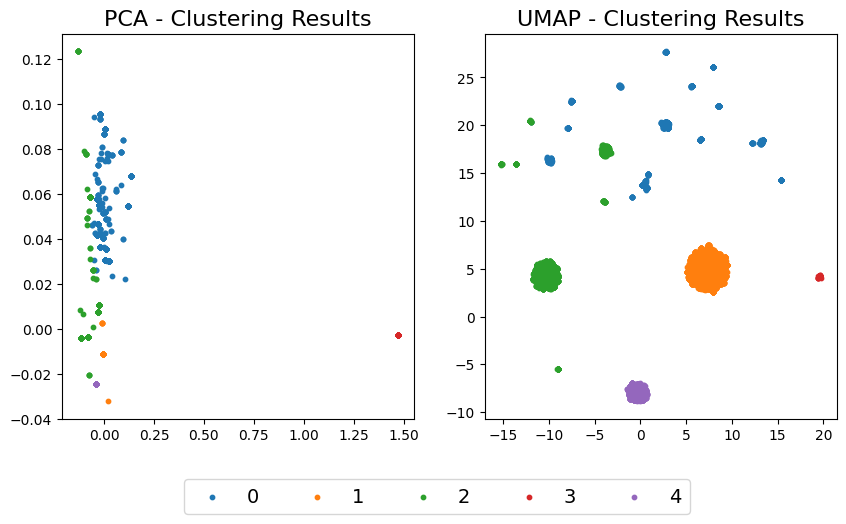

In [20]:
clusters_hierarchical_node2vec_edge = cluster_data_hierarchical(node2vec_edge_embeddings, n_clusters=5)
clustered_data_hierarchical_node2vec_edge = add_clusters_to_log(log, node2vec_edge_embeddings, clusters_hierarchical_node2vec_edge)
clustered_logs_hierarchical_node2vec_edge = split_log_by_clusters(clustered_data_hierarchical_node2vec_edge)

mine_petri_nets(clustered_logs=clustered_logs_hierarchical_node2vec_edge,
                encoding=node2vec_edge_embeddings.iloc[:, 1:], 
                clusters=clusters_hierarchical_node2vec_edge,
                name="Node2Vec Edge Embeddings + Agglomerative Clustering")
plot_dimension_reduction(node2vec_edge_embeddings.iloc[:, 1:], clusters_hierarchical_node2vec_edge)

### Walklets Node Embeddings

=== Cluster 0: 37928 events, 7091 cases ===


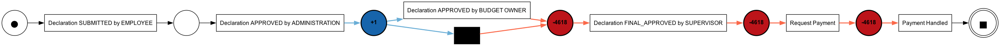

=== Cluster 1: 8443 events, 1967 cases ===


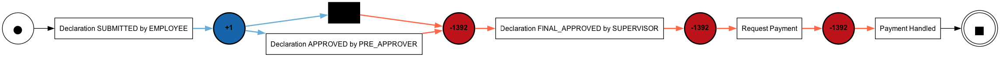

=== Cluster 2: 9270 events, 1104 cases ===


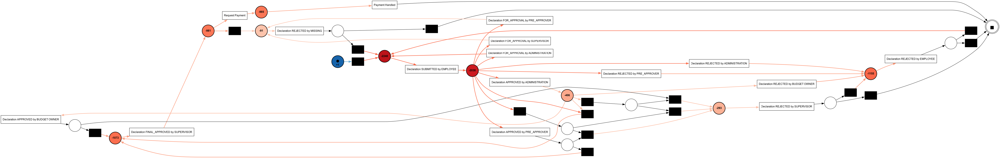

=== Cluster 3: 137 events, 135 cases ===


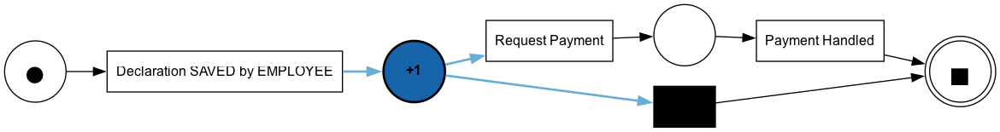

=== Cluster 4: 659 events, 203 cases ===


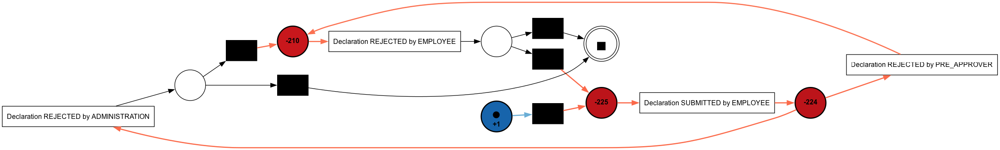

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        1.000000   1.000000        0.986543    1.000000     37928.0  0.875709
1        1.000000   1.000000        0.973551    1.000000      8443.0  0.875709
2        0.888320   0.796946        0.727536    0.581395      9270.0  0.776720
3        1.000000   1.000000        0.456887    1.000000       137.0  0.875709
4        0.995308   0.990847        0.845376    0.800000       659.0  0.871332
=== Weighted Average Process Model Scores ===
fitness           0.981601
precision         0.966541
generalization    0.939122
simplicity        0.928907
custom            0.859399
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.6892723441123962
Custom Metric: 0.8550358564156191


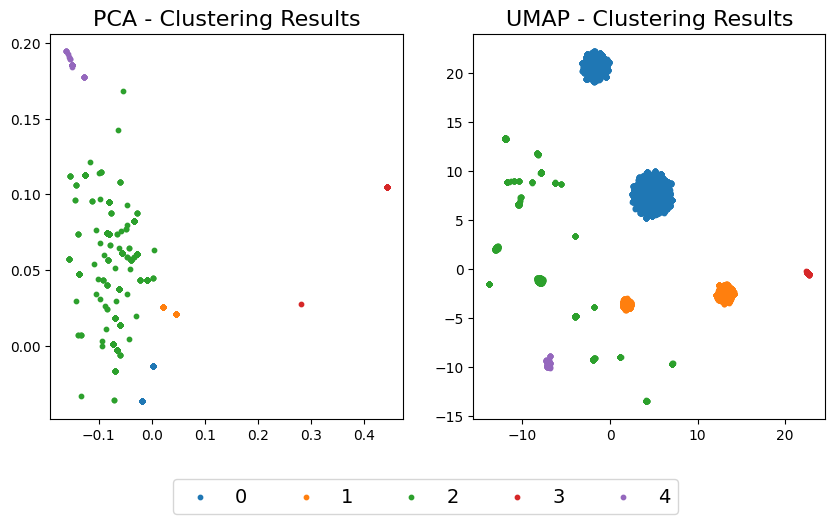

In [21]:
clusters_hierarchical_walklets_node = cluster_data_hierarchical(walklets_node_embeddings, n_clusters=5)
clustered_data_hierarchical_walklets_node = add_clusters_to_log(log, walklets_node_embeddings, clusters_hierarchical_walklets_node)
clustered_logs_hierarchical_walklets_node = split_log_by_clusters(clustered_data_hierarchical_walklets_node)

mine_petri_nets(clustered_logs=clustered_logs_hierarchical_walklets_node,
                encoding=walklets_node_embeddings.iloc[:, 1:], 
                clusters=clusters_hierarchical_walklets_node,
                name="Walklets Node Embeddings + Agglomerative Clustering")
plot_dimension_reduction(walklets_node_embeddings.iloc[:, 1:], clusters_hierarchical_walklets_node)

### Walklets Edge Embeddings

=== Cluster 0: 37928 events, 7091 cases ===


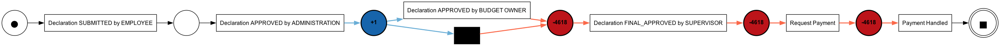

=== Cluster 1: 8825 events, 2035 cases ===


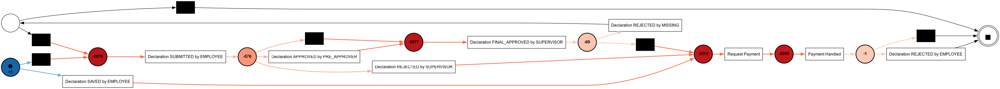

=== Cluster 2: 8891 events, 1037 cases ===


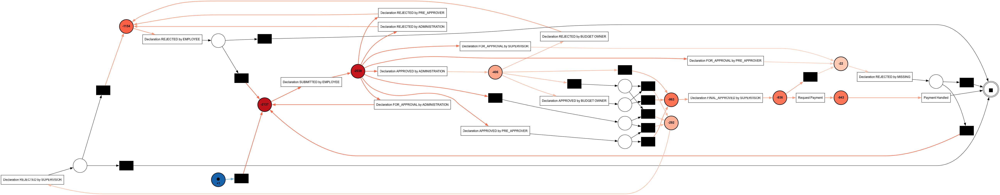

=== Cluster 3: 134 events, 134 cases ===


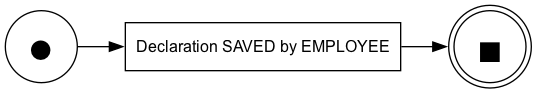

=== Cluster 4: 659 events, 203 cases ===


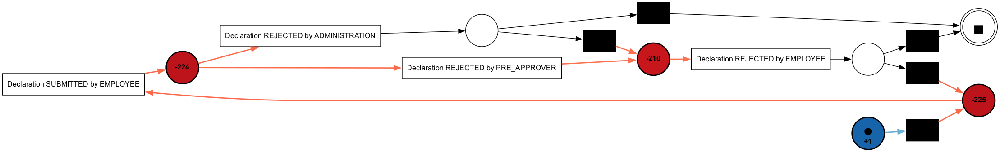

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        1.000000   1.000000        0.986543    1.000000     37928.0  0.884128
1        0.999789   0.978320        0.753740    0.714286      8825.0  0.876488
2        0.937214   0.794100        0.721068    0.595238      8891.0  0.796367
3        1.000000   1.000000        0.913613    1.000000       134.0  0.884128
4        0.995308   0.990847        0.845376    0.800000       659.0  0.879752
=== Weighted Average Process Model Scores ===
fitness           0.990021
precision         0.964066
generalization    0.906496
simplicity        0.889222
custom            0.869057
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.7103212382626924
Custom Metric: 0.8641727617706983


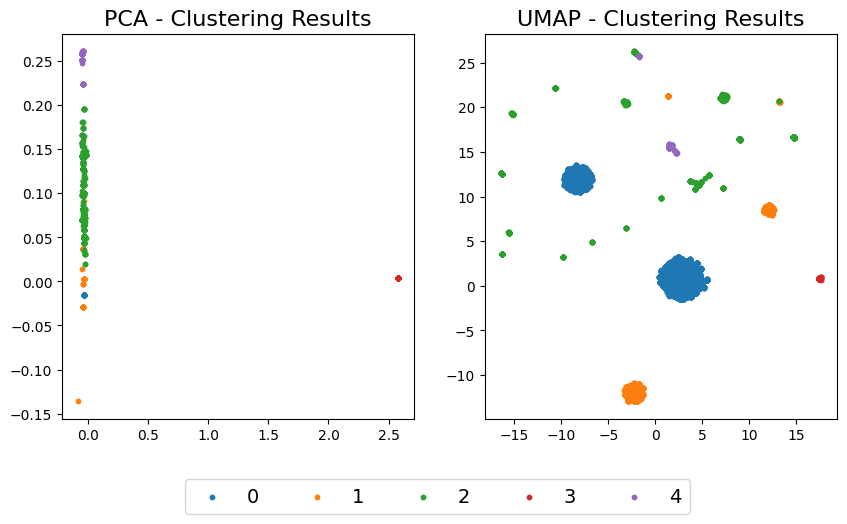

In [22]:
clusters_hierarchical_walklets_edge = cluster_data_hierarchical(walklets_edge_embeddings, n_clusters=5)
clustered_data_hierarchical_walklets_edge = add_clusters_to_log(log, walklets_edge_embeddings, clusters_hierarchical_walklets_edge)
clustered_logs_hierarchical_walklets_edge = split_log_by_clusters(clustered_data_hierarchical_walklets_edge)

mine_petri_nets(clustered_logs=clustered_logs_hierarchical_walklets_edge,
                encoding=walklets_edge_embeddings.iloc[:, 1:], 
                clusters=clusters_hierarchical_walklets_edge,
                name="Walklets Edge Embeddings + Agglomerative Clustering")
plot_dimension_reduction(walklets_edge_embeddings.iloc[:, 1:], clusters_hierarchical_walklets_edge)

### GraphWave Embeddings

=== Cluster 0: 11766 events, 1613 cases ===


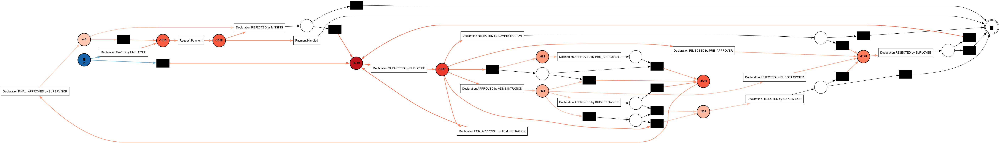

=== Cluster 1: 28658 events, 6010 cases ===


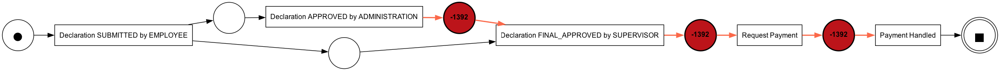

=== Cluster 2: 720 events, 222 cases ===


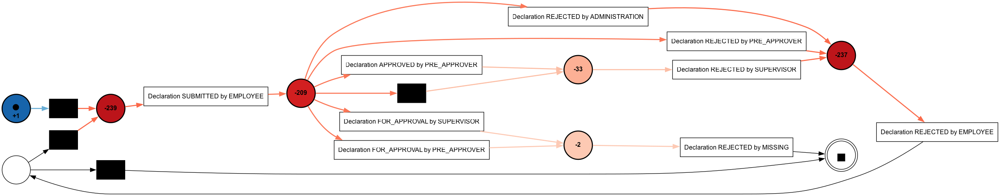

=== Cluster 3: 15159 events, 2521 cases ===


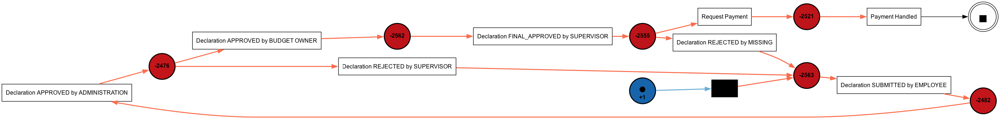

=== Cluster 4: 134 events, 134 cases ===


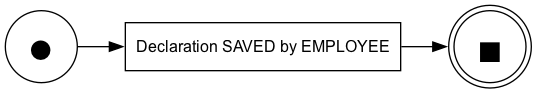

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.918739   0.900107        0.783069    0.590909     11766.0  0.867909
1        0.974265   1.000000        0.986738    1.000000     28658.0  0.916753
2        1.000000   0.964774        0.648246    0.677419       720.0  0.910858
3        0.994582   0.923883        0.856041    0.894737     15159.0  0.895191
4        1.000000   1.000000        0.913613    1.000000       134.0  0.923187
=== Weighted Average Process Model Scores ===
fitness           0.968536
precision         0.958280
generalization    0.904679
simplicity        0.882324
custom            0.900719
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.8079670212997558
Custom Metric: 0.902779667157969


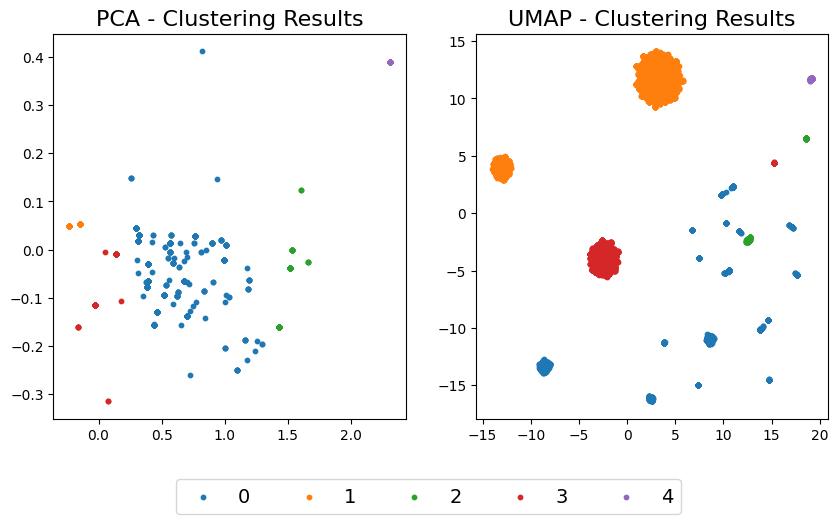

In [23]:
clusters_hierarchical_graphWave = cluster_data_hierarchical(graphWave_node_embeddings, n_clusters=5)
clustered_data_hierarchical_graphWave = add_clusters_to_log(log, graphWave_node_embeddings, clusters_hierarchical_graphWave)
clustered_logs_hierarchical_graphWave = split_log_by_clusters(clustered_data_hierarchical_graphWave)

mine_petri_nets(clustered_logs=clustered_logs_hierarchical_graphWave, 
                encoding=graphWave_node_embeddings.iloc[:, 1:], 
                clusters=clusters_hierarchical_graphWave,
                name="GraphWave Embeddings + Agglomerative Clustering")
plot_dimension_reduction(graphWave_node_embeddings.iloc[:, 1:], clusters_hierarchical_graphWave)

## Clustering with Self-Organizing Maps (SOM) 

### GraphWave Embeddings

=== Cluster 0: 28658 events, 6010 cases ===


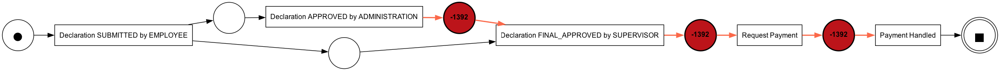

=== Cluster 1: 15159 events, 2521 cases ===


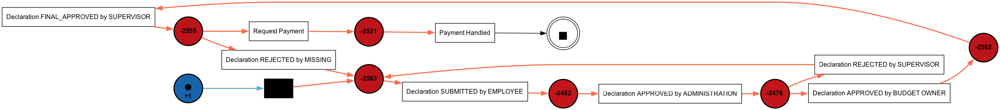

=== Cluster 2: 11253 events, 1526 cases ===


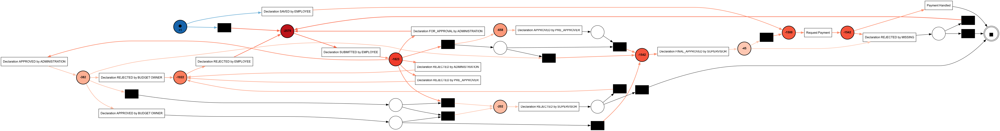

=== Cluster 3: 1233 events, 309 cases ===


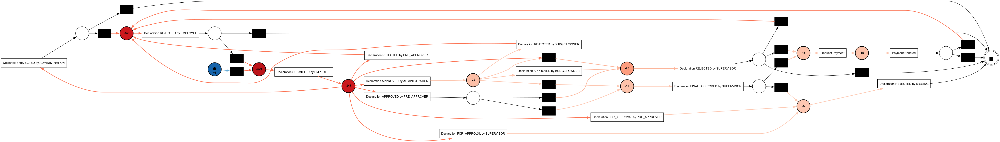

=== Cluster 4: 134 events, 134 cases ===


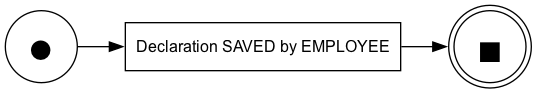

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.974265   1.000000        0.986738    1.000000     28658.0  0.921479
1        0.994582   0.923883        0.856041    0.894737     15159.0  0.899917
2        0.931560   0.898105        0.765542    0.589744     11253.0  0.875139
3        0.959806   0.921726        0.610692    0.615385      1233.0  0.890468
4        1.000000   1.000000        0.913613    1.000000       134.0  0.927913
=== Weighted Average Process Model Scores ===
fitness           0.970953
precision         0.957528
generalization    0.899139
simplicity        0.881522
custom            0.905786
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.8197817588518408
Custom Metric: 0.9029833921529825


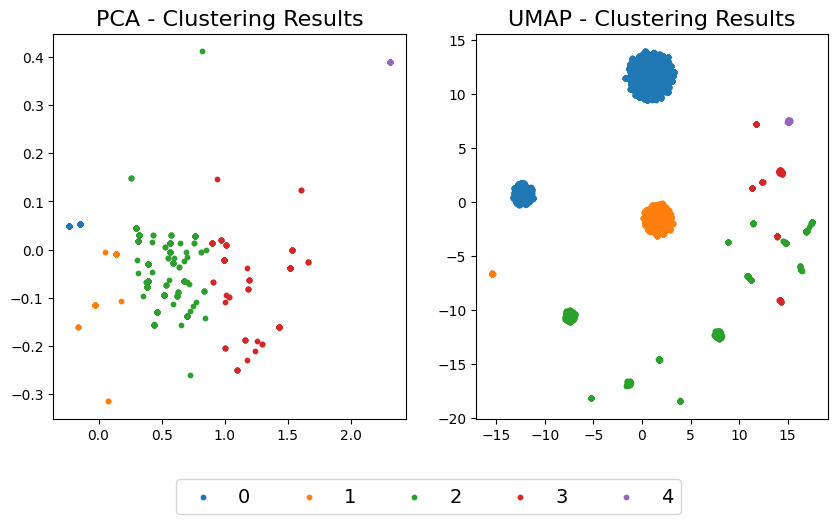

In [24]:
clusters_som_graphWave = cluster_data_som(graphWave_node_embeddings, n_clusters=5)
clustered_data_som_graphWave = add_clusters_to_log(log, graphWave_node_embeddings, clusters_som_graphWave)
clustered_logs_som_graphWave = split_log_by_clusters(clustered_data_som_graphWave)

mine_petri_nets(clustered_logs=clustered_logs_som_graphWave, 
                encoding=graphWave_node_embeddings.iloc[:, 1:], 
                clusters=clusters_som_graphWave,
                name="GraphWave Embeddings + SOM Clustering")
plot_dimension_reduction(graphWave_node_embeddings.iloc[:, 1:], clusters_som_graphWave)

## Clustering with Deep Embedded Clustering (DEC)

### GraphWave Embeddings

=== Cluster 0: 28658 events, 6010 cases ===


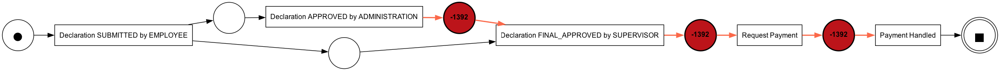

=== Cluster 1: 4297 events, 487 cases ===


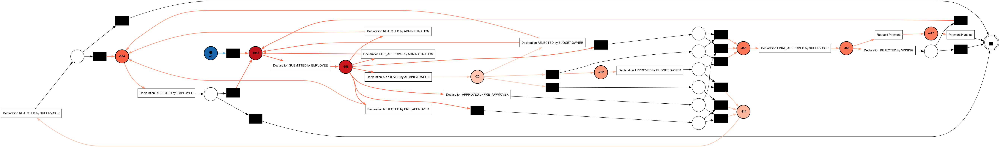

=== Cluster 2: 15154 events, 2521 cases ===


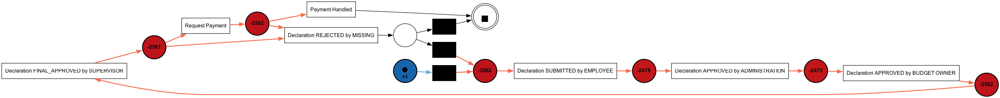

=== Cluster 3: 1018 events, 383 cases ===


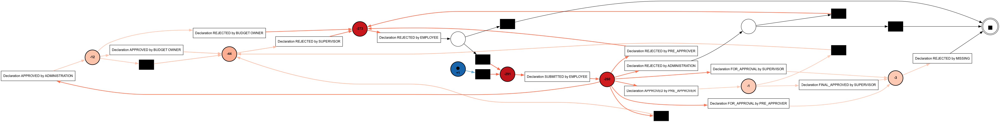

=== Cluster 4: 7310 events, 1099 cases ===


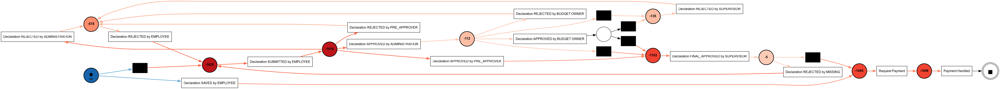

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.974265   1.000000        0.986738    1.000000     28658.0  0.913791
1        0.837502   0.807174        0.720957    0.573034      4297.0  0.812112
2        0.992991   1.000000        0.897623    0.826087     15154.0  0.918473
3        0.647644   0.946961        0.629124    0.615385      1018.0  0.813572
4        0.998994   0.872339        0.823015    0.666667      7310.0  0.875292
=== Weighted Average Process Model Scores ===
fitness           0.966192
precision         0.967827
generalization    0.914917
simplicity        0.870681
custom            0.900512
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.8005627656512604
Custom Metric: 0.8666480612718541


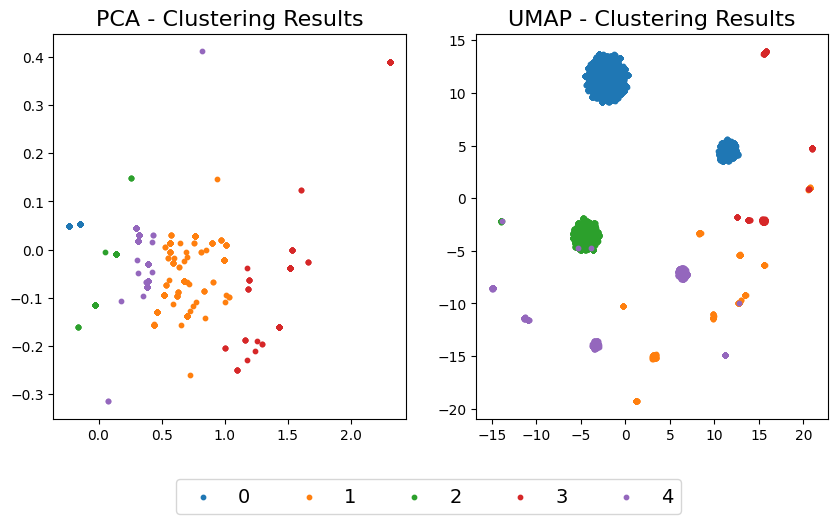

In [25]:
clusters_dec_graphWave = cluster_data_dec(graphWave_node_embeddings, n_clusters=5)
clustered_data_dec_graphWave = add_clusters_to_log(log, graphWave_node_embeddings, clusters_dec_graphWave)
clustered_logs_dec_graphWave = split_log_by_clusters(clustered_data_dec_graphWave)

mine_petri_nets(clustered_logs=clustered_logs_dec_graphWave, 
                encoding=graphWave_node_embeddings.iloc[:, 1:], 
                clusters=clusters_dec_graphWave,
                name="GraphWave Embeddings + DEC Clustering")
plot_dimension_reduction(graphWave_node_embeddings.iloc[:, 1:], clusters_dec_graphWave)

## Evaluation of Process Models

In [26]:
experiment_results_df = pd.DataFrame(experiment_results).T
experiment_results_df

,fitness,precision,generalization,simplicity,custom
Node2Vec Node Embeddings + KMeans,0.993310,0.948436,0.769727,0.672887,0.871394
Node2Vec Edge Embeddings + KMeans,0.990047,0.928345,0.736605,0.748147,0.897244
GraphWave Node Embeddings + KMeans,0.970953,0.957528,0.899139,0.881522,0.905786
Walklets Node Embeddings + KMeans,0.978473,0.907822,0.786178,0.812047,0.895845
Walklets Edge Embeddings + KMeans,0.978385,0.907871,0.781358,0.803225,0.895500
Node2Vec Node Embeddings + Agglomerative Clustering,0.994341,0.967484,0.861954,0.776300,0.850805
Node2Vec Edge Embeddings + Agglomerative Clustering,0.990307,0.947607,0.845582,0.859103,0.899534
Walklets Node Embeddings + Agglomerative Clustering,0.981601,0.966541,0.939122,0.928907,0.859399
Walklets Edge Embeddings + Agglomerative Clustering,0.990021,0.964066,0.906496,0.889222,0.869057
GraphWave Embeddings + Agglomerative Clustering,0.968536,0.958280,0.904679,0.882324,0.900719
